**Name: Han Nga Chan, Honglin Jiang, Ya Chu Hsu, Yifan Fan**

Notebook link: https://colab.research.google.com/drive/19d6cKqC55K7O_8hJqAEyRNCKyPpUzcin?usp=sharing

# Decoding the Cryptic: Analyzing Bitcoin Market Trends with Machine Learning



#**I. Introduction**

**Problem Definition:**

Our analysis of the Bitcoin market aims to use machine learning to forecast the direction of price changes using technical indicators. Different technical indicators provide information about how the market might potentially fluctuate. We would like to study how the difference, magnitude and directions of technical indicators can provide information or be used as a reference for predicting whether the prices are going up or down for the next day. This helps the algorithm trader or other bitcoin buyer to have an idea on making their strategic decision on the timing to buy in or sell the bitcoin and earning a return from the trading.



**Possible stakeholders and reason they care:**

Effective cryptocurrency risk management is imperative in navigating the volatile market landscape. Our meticulous cryptocurrency data analysis delves into intricate Bitcoin price patterns and trends. This depth of understanding empowers us to forecast future price movements, enabling the development of robust, forward-thinking trading strategies anchored in prudent risk management practices.

The insights derived from our analysis hold immense value, particularly for high-frequency and algorithmic traders seeking alpha. Our findings serve as a compass, aiding traders in strategically incorporating specific technical indicators into their trading algorithms. This strategic integration enhances predictive accuracy, fostering more precise and strategic algorithmic trading developments.

For novice Bitcoin investors or enthusiasts, our analysis offers a concise introduction to various technical indicators commonly utilized in algorithmic Bitcoin trading. It serves as a guide, shedding light on which technical indicators to explore further, facilitating a foundational understanding to predict price movements more effectively.

Beyond traders, the financial industry, including banks and asset managers, stands to benefit significantly from our analysis. Deepening their comprehension of Bitcoin's cyclical behavior equips them to devise innovative investment or wealth management products tailored around Bitcoin. These products offer a comparatively lower-risk avenue for their clients, steering away from direct Bitcoin trading. This strategic positioning grants financial institutions a competitive edge in an increasingly competitive market landscape.


**Data description:**

We are using a dataset from Kaggle derived from BTC trading data published by Binance (a global cryptocurrency exchange platform). The dataset includes BTC pricing and indicator data from 2020-01-01 to 2023-10-22 by minutes.
It has around 2,000,000 entries and 27 columns with data type ranging between timeseries object, int, and float. This dataset contains BTC market pricing data and technical indcators derived from historical pricing data including ATR, HMA, KAMA	CMO, Z-Score, QStick. However, after furthure examination, we decide to condense the data to day-by-day pricing and expande the data with another set of derived technical indicators that are more comprehensive, including Volume, Momentum, Volatility Indicators. The reasoning is we found that due to the volatile nature of BTC price, the price are weakly efficient at the minute frequency. Furthuremore, the original set of technical indicators are mostly trend related which wouldn't be sufficient for our model. We hope to provide a more complete picture to our model with more comprehensive indicators

**Target Variable**:

BTC Next Day Price Change (up vs. down): Next day close price movement comparing to the previous day, whether it has gone up or down. For the purpose of this project, we change to forecast on Close Prices as opposed to Open, High, or Low Prices. Our reasoning is Open Prices are subject to after-market volatility, and High/Low prices are too volatile and aren't representative of asset performance.


---




**Key Features**:

| # | Column                | Overview |
|---|-----------------------|----------|
| 0 | open                  | Opening price for the period |
| 1 | high                  | Highest price reached in the period |
| 2 | low                   | Lowest price reached in the period |
| 3 | close                 | Closing price for the period |
| 4 | Volume USDT           | Trading volume in USDT for the period |
| 5 | SMA_3                 | Simple Moving Average over 3 periods |
| 6 | CMA_3                 | Cumulative Moving Average over 3 periods |
| 7 | ema_3                 | Exponential Moving Average over 3 periods, gives more weight to recent data |
| 8 | MACD                  | Moving Average Convergence Divergence, shows trend and momentum |
| 9 | MACD_Signal           | Signal line for MACD, used for buy/sell signals |
| 10| MACD_Hist             | Histogram for MACD, difference between MACD and its signal line |
| 11| Parabolic_SAR         | Provides potential stop-loss levels for trending markets |
| 12| Aroon_Up              | Part of Aroon Indicator, identifies if a new high has occurred within a given time frame |
| 13| Aroon_Down            | Part of Aroon Indicator, identifies if a new low has occurred |
| 14| RSI                   | Relative Strength Index, indicates overbought or oversold conditions |
| 15| Stochastic_Oscillator | Momentum indicator comparing closing price to price range over a certain period |
| 16| CCI                   | Commodity Channel Index, identifies cyclical trends |
| 17| OBV                   | On-Balance Volume, uses volume flow to predict changes in stock price |
| 18| Acc_Dist_Line         | Accumulation/Distribution Line, measures the cumulative flow of money into and out of a security |
| 19| ATR                   | Average True Range, a measure of market volatility |
| 20| Bollinger_M           | Middle Band of Bollinger Bands, typically an N-period SMA |
| 21| Bollinger_H           | Upper Band of Bollinger Bands, indicates overbought condition |
| 22| Bollinger_L           | Lower Band of Bollinger Bands, indicates oversold condition |
| 23| movement              | Describes the price movement direction ('Up' or 'Down') |


# **II. Data Clearning and Feature Creation**

In [194]:
!pip install pandas-ta

In [195]:
!pip install ta

In [196]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import ta
from pandas_ta import wma, macd, stoch, adx, atr, hma, kama, cmo, zscore, qstick

In [197]:
from google.colab import drive
drive.mount('/content/gdrive')
df = pd.read_csv('/content/gdrive/MyDrive/BA810_project/btc_market_data.csv')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [198]:
#Show the dataset
df.head()

,date,symbol,open,high,low,close,Volume USDT,tradecount,token,hour,day,ema_5,ema_15,ema_30,ema_60,ema_100,ema_200,WMA,MACD,MACD_Signal,MACD_Hist,ATR,HMA,KAMA,CMO,Z-Score,QStick
0,2020-01-01 00:01:00,BTC/USDT,7182.43,7182.44,7178.75,7179.01,509146,140,BTC,0,Wednesday,7178.557958,7178.357760,7177.701022,7179.328746,7184.279990,7194.752301,7179.078190,0.728704,-0.152219,0.880923,4.684925,7177.563636,7178.824357,4.193879,0.620718,0.120
1,2020-01-01 00:02:00,BTC/USDT,7179.01,7179.01,7175.25,7177.93,713540,148,BTC,0,Wednesday,7178.331936,7178.264583,7177.610747,7179.339551,7184.386454,7194.910516,7179.128476,0.736887,-0.182091,0.918978,4.698380,7176.318505,7178.819894,0.859360,0.359448,0.528
2,2020-01-01 00:03:00,BTC/USDT,7177.77,7182.60,7177.00,7181.11,497793,104,BTC,0,Wednesday,7178.532904,7178.312380,7177.588730,7179.387332,7184.516888,7195.081174,7179.299905,0.846578,-0.117923,0.964501,4.609025,7175.562717,7178.843061,11.466626,1.198367,0.493
3,2020-01-01 00:04:00,BTC/USDT,7179.10,7179.10,7172.94,7175.25,698627,193,BTC,0,Wednesday,7177.244357,7177.912720,7177.345883,7179.328937,7184.585714,7195.221588,7178.981619,0.650488,-0.343494,0.993981,4.398181,7175.694414,7178.783250,-7.962104,-0.321289,-0.425
4,2020-01-01 00:05:00,BTC/USDT,7174.71,7177.14,7173.28,7175.61,241980,124,BTC,0,Wednesday,7178.241535,7178.293109,7177.490427,7179.467206,7184.774314,7195.422307,7179.421905,0.987398,-0.092457,1.079855,4.262656,7178.227646,7178.811842,-6.795307,-0.228270,-0.131


In [199]:
#Change the date column to datetime format
df['date'] = pd.to_datetime(df['date'])

In [200]:
#Check the number of null value for each columns
missing_values = df.isnull().sum()
# Clean the data by removing duplicates
df = df.drop_duplicates()
df = df.sort_values(by='date')
missing_values

date             0
symbol           0
open             0
high             0
low              0
close            0
Volume USDT      0
tradecount       0
token            0
hour             0
day              0
ema_5            0
ema_15           0
ema_30           0
ema_60           0
ema_100          0
ema_200          0
WMA             13
MACD            25
MACD_Signal     33
MACD_Hist       33
ATR             14
HMA             11
KAMA             9
CMO             14
Z-Score        154
QStick           9
dtype: int64

In [201]:
df.head(5)

,date,symbol,open,high,low,close,Volume USDT,tradecount,token,hour,day,ema_5,ema_15,ema_30,ema_60,ema_100,ema_200,WMA,MACD,MACD_Signal,MACD_Hist,ATR,HMA,KAMA,CMO,Z-Score,QStick
0,2020-01-01 00:01:00,BTC/USDT,7182.43,7182.44,7178.75,7179.01,509146,140,BTC,0,Wednesday,7178.557958,7178.357760,7177.701022,7179.328746,7184.279990,7194.752301,7179.078190,0.728704,-0.152219,0.880923,4.684925,7177.563636,7178.824357,4.193879,0.620718,0.120
1,2020-01-01 00:02:00,BTC/USDT,7179.01,7179.01,7175.25,7177.93,713540,148,BTC,0,Wednesday,7178.331936,7178.264583,7177.610747,7179.339551,7184.386454,7194.910516,7179.128476,0.736887,-0.182091,0.918978,4.698380,7176.318505,7178.819894,0.859360,0.359448,0.528
2,2020-01-01 00:03:00,BTC/USDT,7177.77,7182.60,7177.00,7181.11,497793,104,BTC,0,Wednesday,7178.532904,7178.312380,7177.588730,7179.387332,7184.516888,7195.081174,7179.299905,0.846578,-0.117923,0.964501,4.609025,7175.562717,7178.843061,11.466626,1.198367,0.493
3,2020-01-01 00:04:00,BTC/USDT,7179.10,7179.10,7172.94,7175.25,698627,193,BTC,0,Wednesday,7177.244357,7177.912720,7177.345883,7179.328937,7184.585714,7195.221588,7178.981619,0.650488,-0.343494,0.993981,4.398181,7175.694414,7178.783250,-7.962104,-0.321289,-0.425
4,2020-01-01 00:05:00,BTC/USDT,7174.71,7177.14,7173.28,7175.61,241980,124,BTC,0,Wednesday,7178.241535,7178.293109,7177.490427,7179.467206,7184.774314,7195.422307,7179.421905,0.987398,-0.092457,1.079855,4.262656,7178.227646,7178.811842,-6.795307,-0.228270,-0.131


In [202]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, r2_score

# Set the column 'date' as the index
df.set_index('date', inplace=True)

# Resample the data to get daily data
daily_df = df.resample('D').agg({'open': 'first',
                                  'high': 'max',
                                  'low': 'min',
                                  'close': 'last',
                                  'Volume USDT': 'sum'})
#Check the null value
daily_df[daily_df.isnull().any(axis=1)]

,open,high,low,close,Volume USDT
date,,,,,
2023-07-30,NaN,NaN,NaN,NaN,0
2023-08-21,NaN,NaN,NaN,NaN,0
2023-08-22,NaN,NaN,NaN,NaN,0


In [203]:
#Drop the null value
daily_df.dropna(inplace=True)
daily_df.shape

(1388, 5)

###Trend Indicators

**Definition**: Trend indicators in Bitcoin trading assess the direction and strength of prevailing price movements. They help traders identify whether Bitcoin is in an uptrend, downtrend, or ranging (sideways) market.

**Significance**: Trend indicators assist traders in recognizing the primary direction of Bitcoin's price movement over time, helping them make decisions aligned with the prevailing trend.

**Utility**: By using trend indicators, traders can determine the dominant market sentiment (bullish or bearish), identify potential entry and exit points, and avoid trading against the prevailing trend.


In [204]:
##SMA-3
for i in range(0,daily_df.shape[0]-2):
    daily_df.loc[daily_df.index[i+2],'SMA_3'] = np.round(((daily_df.iloc[i,3]+ daily_df.iloc[i+1,3] +daily_df.iloc[i+2,3])/3),1)

In [205]:
##CMA-3
daily_df['CMA_3'] = daily_df['close'].expanding(min_periods=3).mean()

In [206]:
##EMA-3
daily_df['ema_3'] = daily_df['close'].ewm(span=3).mean()

In [207]:
##MACD
daily_df[['MACD', 'MACD_Signal', 'MACD_Hist']] = macd(daily_df['close'])

In [208]:
##Parbolic_SAR
daily_df['Parabolic_SAR'] = ta.trend.psar_down_indicator(daily_df['high'], daily_df['low'], daily_df['close'])

In [209]:
##Aroon Indicator
daily_df['Aroon_Up'] = ta.trend.aroon_up(daily_df['high'], daily_df['low'])
daily_df['Aroon_Down'] = ta.trend.aroon_down(daily_df['high'], daily_df['low'])

###Momentum Indicators

**Definition**: Momentum indicators in Bitcoin trading measure the rate of price change, indicating whether Bitcoin is gaining or losing momentum. They help traders assess the strength and potential continuation of price movements.

**Significance**: Momentum indicators reveal the speed and intensity of Bitcoin price changes, assisting traders in identifying potential trend reversals or confirmations.

**Utility**: Traders use momentum indicators to spot overbought or oversold conditions, assess the strength of a trend, and make decisions about market entries and exits.

In [210]:
##RSI
daily_df['RSI'] = ta.momentum.rsi(daily_df['close'])

In [211]:
##Stochastic Oscillator
daily_df['Stochastic_Oscillator'] = ta.momentum.stoch(daily_df['high'], daily_df['low'], daily_df['close'])

In [212]:
##Commodity Channel Index (CCI)
daily_df['CCI'] = ta.trend.cci(daily_df['high'], daily_df['low'], daily_df['close'])

###Volume Indicators

**Definition**: Volume indicators in Bitcoin trading analyze trading volume, indicating the level of participation in the market. They help traders assess market liquidity and potential price reversals.

**Significance**: Volume indicators provide insights into the level of interest and commitment of traders in Bitcoin markets, which can impact price movements.

**Utility**: By monitoring volume indicators, traders can confirm or question the validity of price trends, identify potential reversals based on trading activity, and make informed trading decisions.


In [213]:
## On-Balance Volume (OBV)
daily_df['OBV'] = ta.volume.on_balance_volume(daily_df['close'], daily_df['Volume USDT'])

In [214]:
## Accumulation/Distribution Line
daily_df['Acc_Dist_Line'] = ta.volume.acc_dist_index(daily_df['high'], daily_df['low'], daily_df['close'], daily_df['Volume USDT'])

##Volatitily Indicators

**Definition**: Volatility indicators in Bitcoin trading measure the degree of price variation and market uncertainty. They help traders assess the potential for significant price swings and fluctuations.

**Significance**: Volatility indicators indicate the level of risk and instability in Bitcoin markets, which can impact trading strategies and risk management.

**Utility**: Traders use volatility indicators to set stop-loss levels, determine position sizes, and gauge market conditions. High volatility can offer trading opportunities but also carries higher risk, requiring careful planning.

In [215]:
## Average True Range (ATR)
daily_df['ATR'] = ta.volatility.average_true_range(daily_df['high'], daily_df['low'], daily_df['close'])

In [216]:
## Bollinger Bands
daily_df['Bollinger_M'] = ta.volatility.bollinger_mavg(daily_df['close'])
daily_df['Bollinger_H'] = ta.volatility.bollinger_hband(daily_df['close'])
daily_df['Bollinger_L'] = ta.volatility.bollinger_lband(daily_df['close'])


In [217]:
#Check the null value after new feature creations
#As some feature require records for the past 33 periods hence some features for the first 33 days might be null
daily_df.isnull().sum()

open                      0
high                      0
low                       0
close                     0
Volume USDT               0
SMA_3                     2
CMA_3                     2
ema_3                     0
MACD                     25
MACD_Signal              33
MACD_Hist                33
Parabolic_SAR             0
Aroon_Up                 25
Aroon_Down               25
RSI                      13
Stochastic_Oscillator    13
CCI                      19
OBV                       0
Acc_Dist_Line             0
ATR                       0
Bollinger_M              19
Bollinger_H              19
Bollinger_L              19
dtype: int64

In [218]:
#Show the rows with null value
daily_df[daily_df.isnull().any(axis=1)]

,open,high,low,close,Volume USDT,SMA_3,CMA_3,ema_3,MACD,MACD_Signal,MACD_Hist,Parabolic_SAR,Aroon_Up,Aroon_Down,RSI,Stochastic_Oscillator,CCI,OBV,Acc_Dist_Line,ATR,Bollinger_M,Bollinger_H,Bollinger_L
date,,,,,,,,,,,,,,,,,,,,,,,
2020-01-01,7182.43,7260.43,7170.15,7197.57,407911300,NaN,NaN,7197.570000,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,407911300,-1.601282e+08,0.000000,NaN,NaN,NaN
2020-01-02,7197.57,7209.59,6922.00,6962.04,815627839,NaN,NaN,7040.550000,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,-407716539,-7.486429e+08,0.000000,NaN,NaN,NaN
2020-01-03,6962.34,7407.28,6863.44,7341.72,1507313610,7167.1,7167.110000,7212.647143,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1099597071,3.952569e+08,0.000000,NaN,NaN,NaN
2020-01-04,7341.60,7400.00,7269.21,7350.71,678402361,7218.2,7213.010000,7286.280667,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,1777999432,5.623289e+08,0.000000,NaN,NaN,NaN
2020-01-05,7350.54,7495.00,7303.00,7354.36,874488523,7348.9,7241.280000,7321.418387,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,2652487955,1.556917e+08,0.000000,NaN,NaN,NaN
2020-01-06,7354.36,7808.65,7345.00,7757.39,1272203790,7487.5,7327.298333,7542.864286,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,3924691745,1.146592e+09,0.000000,NaN,NaN,NaN
2020-01-07,7757.74,8215.33,7733.00,8152.49,2233372052,7754.7,7445.182857,7850.077244,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,6158063797,2.798018e+09,0.000000,NaN,NaN,NaN
2020-01-08,8150.90,8468.42,7870.11,8059.84,2644782854,7989.9,7522.015000,7955.369922,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,3513280943,1.830608e+09,0.000000,NaN,NaN,NaN
2020-01-09,8059.77,8060.00,7750.01,7818.59,1478591339,8010.3,7554.967778,7886.846125,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,2034689604,1.006243e+09,0.000000,NaN,NaN,NaN


In [219]:
# Slice the range of day that as the null value in the columns
start_date = pd.to_datetime('2020-01-01').date()
end_date = pd.to_datetime('2020-02-02').date()
daily_df = daily_df[(daily_df.index.date > end_date) ]


In [220]:
pd.set_option('display.max_columns', None)
daily_df.head()

,open,high,low,close,Volume USDT,SMA_3,CMA_3,ema_3,MACD,MACD_Signal,MACD_Hist,Parabolic_SAR,Aroon_Up,Aroon_Down,RSI,Stochastic_Oscillator,CCI,OBV,Acc_Dist_Line,ATR,Bollinger_M,Bollinger_H,Bollinger_L
date,,,,,,,,,,,,,,,,,,,,,,,
2020-02-03,9340.49,9647.61,9250.00,9300.64,1491076824,9343.9,8466.963824,9328.923056,395.175072,21.969807,373.205265,0.0,100.0,4.0,65.113805,75.227222,103.193114,6724734331,8.893850e+09,340.314969,8926.4855,9655.500840,8197.470160
2020-02-04,9300.63,9368.00,9105.00,9198.35,1363688326,9279.1,8487.860571,9263.636528,372.414479,-0.632628,373.047108,0.0,96.0,0.0,61.790204,67.923976,59.005703,5361046005,8.498225e+09,334.792471,8945.1380,9681.891733,8208.384267
2020-02-05,9198.32,9799.08,9179.88,9630.00,2014987371,9376.3,8519.586667,9446.818264,384.771685,9.379662,375.392023,0.0,100.0,4.0,68.984629,89.106232,106.269853,7376033376,9.412780e+09,355.107295,8990.3840,9776.983865,8203.784135
2020-02-06,9630.00,9884.00,9550.00,9778.12,1950865330,9535.5,8553.601081,9612.469132,401.884234,21.193769,380.690465,0.0,100.0,0.0,71.002306,93.532071,124.267146,9326898706,1.012677e+10,353.599631,9033.3540,9890.344151,8176.363849
2020-02-07,9777.97,9900.00,9736.66,9821.52,1272175087,9743.2,8586.967368,9716.994566,414.173733,26.786614,387.387119,0.0,100.0,0.0,71.585582,95.179361,121.041429,10599073793,1.017646e+10,340.009657,9078.1800,9999.205325,8157.154675


In [221]:
#Check to ensure there is no any null value
daily_df.isnull().sum()

open                     0
high                     0
low                      0
close                    0
Volume USDT              0
SMA_3                    0
CMA_3                    0
ema_3                    0
MACD                     0
MACD_Signal              0
MACD_Hist                0
Parabolic_SAR            0
Aroon_Up                 0
Aroon_Down               0
RSI                      0
Stochastic_Oscillator    0
CCI                      0
OBV                      0
Acc_Dist_Line            0
ATR                      0
Bollinger_M              0
Bollinger_H              0
Bollinger_L              0
dtype: int64

In [222]:
# Add new column with closing price lagged by 1 day and dropped the first row
daily_df['movement'] = daily_df['close'].shift(-1) - daily_df['close']
daily_df['movement'] = daily_df['movement'].apply(lambda x: 'Up' if x > 0 else 'Down')
daily_df.dropna(inplace=True)

In [223]:
daily_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1355 entries, 2020-02-03 to 2023-10-22
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   open                   1355 non-null   float64
 1   high                   1355 non-null   float64
 2   low                    1355 non-null   float64
 3   close                  1355 non-null   float64
 4   Volume USDT            1355 non-null   int64  
 5   SMA_3                  1355 non-null   float64
 6   CMA_3                  1355 non-null   float64
 7   ema_3                  1355 non-null   float64
 8   MACD                   1355 non-null   float64
 9   MACD_Signal            1355 non-null   float64
 10  MACD_Hist              1355 non-null   float64
 11  Parabolic_SAR          1355 non-null   float64
 12  Aroon_Up               1355 non-null   float64
 13  Aroon_Down             1355 non-null   float64
 14  RSI                    1355 non-null  

In [224]:
#Check if the class is balanced
daily_df['movement'].value_counts()

Up      686
Down    669
Name: movement, dtype: int64

In [225]:
daily_df.head()

,open,high,low,close,Volume USDT,SMA_3,CMA_3,ema_3,MACD,MACD_Signal,MACD_Hist,Parabolic_SAR,Aroon_Up,Aroon_Down,RSI,Stochastic_Oscillator,CCI,OBV,Acc_Dist_Line,ATR,Bollinger_M,Bollinger_H,Bollinger_L,movement
date,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-03,9340.49,9647.61,9250.00,9300.64,1491076824,9343.9,8466.963824,9328.923056,395.175072,21.969807,373.205265,0.0,100.0,4.0,65.113805,75.227222,103.193114,6724734331,8.893850e+09,340.314969,8926.4855,9655.500840,8197.470160,Down
2020-02-04,9300.63,9368.00,9105.00,9198.35,1363688326,9279.1,8487.860571,9263.636528,372.414479,-0.632628,373.047108,0.0,96.0,0.0,61.790204,67.923976,59.005703,5361046005,8.498225e+09,334.792471,8945.1380,9681.891733,8208.384267,Up
2020-02-05,9198.32,9799.08,9179.88,9630.00,2014987371,9376.3,8519.586667,9446.818264,384.771685,9.379662,375.392023,0.0,100.0,4.0,68.984629,89.106232,106.269853,7376033376,9.412780e+09,355.107295,8990.3840,9776.983865,8203.784135,Up
2020-02-06,9630.00,9884.00,9550.00,9778.12,1950865330,9535.5,8553.601081,9612.469132,401.884234,21.193769,380.690465,0.0,100.0,0.0,71.002306,93.532071,124.267146,9326898706,1.012677e+10,353.599631,9033.3540,9890.344151,8176.363849,Up
2020-02-07,9777.97,9900.00,9736.66,9821.52,1272175087,9743.2,8586.967368,9716.994566,414.173733,26.786614,387.387119,0.0,100.0,0.0,71.585582,95.179361,121.041429,10599073793,1.017646e+10,340.009657,9078.1800,9999.205325,8157.154675,Up


# **III. EDA**

In this exploratory data analysis (EDA) storyline, we start with the Bitcoin market, delving into its volatility and trends using various visualizations and statistical summaries.


Our journey begins with a candlestick chart, a staple for financial analysis, which reveals the price movements of Bitcoin over time. Each candle provides four key pieces of information at a glance: the opening and closing prices, along with the high and low points of each period, painting a picture of market sentiment and volatility.

In [226]:
# Candlestick
import plotly.graph_objects as go
fig = go.Figure(data=[go.Candlestick(x=daily_df.index,
                open=daily_df['open'], high=daily_df['high'],
                low=daily_df['low'], close=daily_df['close'])])
fig.update_layout(title='Bitcoin Candlestick Chart', xaxis_rangeslider_visible=False)

fig.show()

Moving to a statistical summary, we quantify the descriptive aspects of the market, observing measures of central tendency, dispersion, and the shape of the distribution of Bitcoin prices. This statistical grounding paves the way for deeper analysis, highlighting potential outliers and patterns.


In [227]:
daily_df.describe()

,open,high,low,close,Volume USDT,SMA_3,CMA_3,ema_3,MACD,MACD_Signal,MACD_Hist,Parabolic_SAR,Aroon_Up,Aroon_Down,RSI,Stochastic_Oscillator,CCI,OBV,Acc_Dist_Line,ATR,Bollinger_M,Bollinger_H,Bollinger_L
count,1355.000000,1355.000000,1355.000000,1355.000000,1.355000e+03,1355.000000,1355.000000,1355.000000,1355.000000,1355.000000,1355.000000,1355.000000,1355.000000,1355.000000,1355.000000,1355.000000,1355.000000,1.355000e+03,1.355000e+03,1355.000000,1355.000000,1355.000000,1355.000000
mean,28842.052162,29574.889085,28033.917911,28857.615232,2.831116e+09,28842.407085,22282.252261,28842.573044,98.585167,0.102128,98.483039,0.040590,52.498893,40.802952,52.128655,53.757194,9.961658,1.726452e+10,1.697048e+11,1536.460519,28722.178077,32007.909311,25436.446843
std,15169.287763,15601.815469,14655.366869,15160.154797,2.172968e+09,15149.303666,8713.913043,15139.418680,1418.226423,392.535771,1348.592674,0.197412,35.780708,34.393053,13.549507,28.171456,115.640093,5.755496e+10,7.295118e+10,1125.047189,15094.699851,17144.711601,13335.659269
min,4762.280000,5361.260000,3621.810000,4764.650000,2.351609e+08,5167.300000,7991.838487,5245.298604,-5073.278718,-1726.925154,-4435.851793,0.000000,0.000000,0.000000,14.903612,0.248844,-509.110163,-1.294270e+11,7.264573e+09,197.603061,5940.556500,7119.355064,3776.578416
25%,17099.390000,17311.500000,16856.875000,17116.595000,1.399266e+09,17070.500000,11500.266882,17089.598456,-559.348877,-152.676825,-487.566526,0.000000,16.000000,8.000000,42.741084,29.371933,-78.313439,-3.888800e+10,1.257698e+11,638.232350,17028.873000,18691.827388,15912.383451
50%,26968.610000,27410.000000,26601.800000,27021.390000,2.245993e+09,26985.700000,28372.222457,27021.545976,32.068625,8.584431,17.487909,0.000000,56.000000,36.000000,50.482090,53.703181,11.962301,3.911579e+10,1.997955e+11,1025.791831,27003.426500,28943.367814,25138.883718
75%,39699.595000,40855.680000,38472.050000,39699.590000,3.643032e+09,39801.950000,29190.321261,39625.080751,672.004343,167.168366,681.556952,0.000000,88.000000,72.000000,60.778455,80.051305,97.828206,5.796937e+10,2.205557e+11,2354.242878,40117.449000,45445.744187,34787.198458
max,67525.820000,69000.000000,66222.400000,67525.830000,1.746531e+10,66452.000000,30990.833958,65947.244630,5248.182302,1303.727940,4502.929441,1.000000,100.000000,100.000000,89.570158,99.911728,369.699732,1.188569e+11,2.485308e+11,5296.656289,63095.481000,68878.935063,58962.740490


The Seaborn library aids in visualizing the distribution of Bitcoin prices through boxplots, which underscore the spread and central values, alerting us to any potential anomalies or outliers that warrant closer examination.

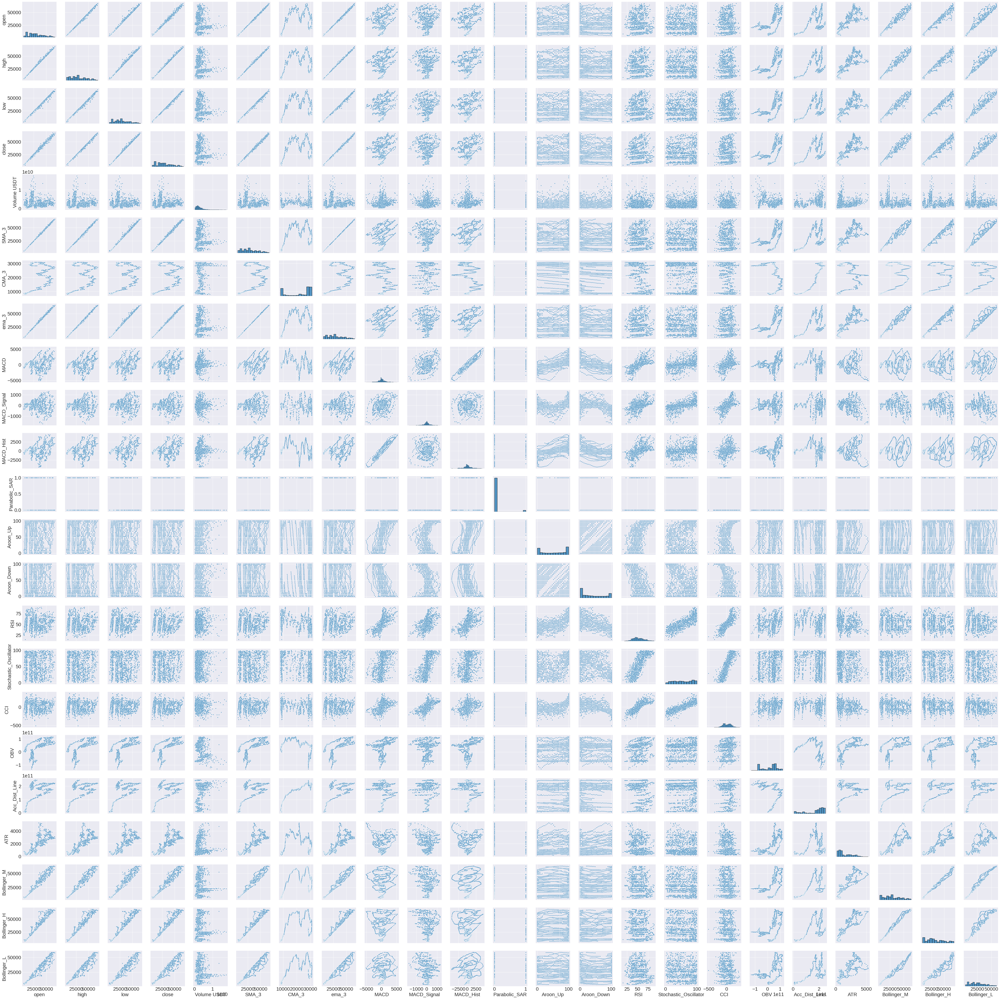

In [228]:
#Pairplot
import seaborn as sns
attributes = daily_df.drop(columns = 'movement')
sns.pairplot(attributes, markers='.');

The class bar plot further enriches our understanding by showing the frequency of 'Up' versus 'Down' movements, providing insights into market trends and behaviors.

<Axes: xlabel='movement', ylabel='Count'>

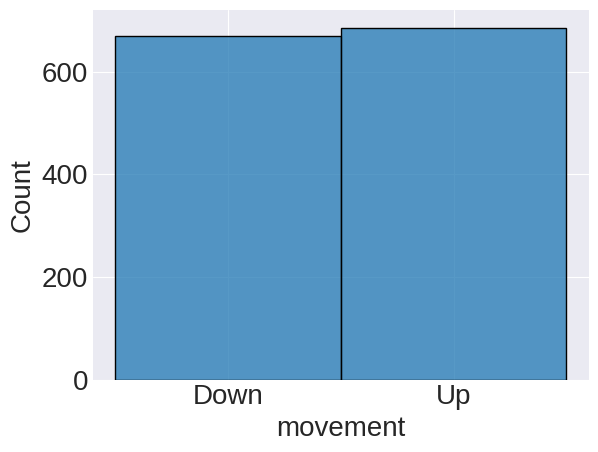

In [229]:
#Distribution of class
sns.histplot(x = 'movement', data = daily_df )

A heatmap of the correlations between various technical indicators offers a bird's-eye view of relationships within the data. This not only helps in feature selection for predictive modeling but also flags multicollinearity that could affect model performance.


<ipython-input-230-c016e989a7da>:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



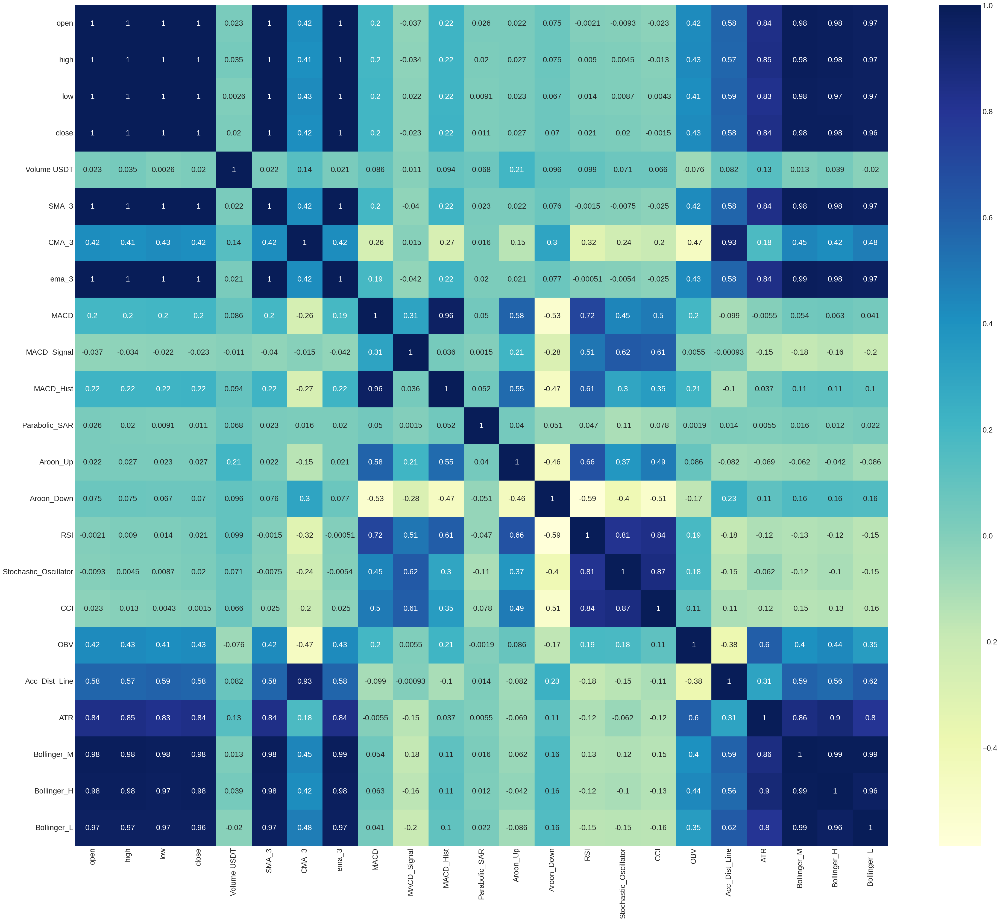

In [230]:
#Heat map
plt.figure(figsize=(48, 40))
corr_matrix = daily_df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='YlGnBu');

The story becomes more intriguing as we overlay price trends with a key indicator from the heatmap. By selecting a highly correlated pair, such as the closing price and a moving average or the MACD indicator, we plot these on a single line graph to observe how the indicator tracks or diverges from the actual price movements, offering clues on potential buy or sell signals.


<ipython-input-231-bbec12a6e6eb>:2: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



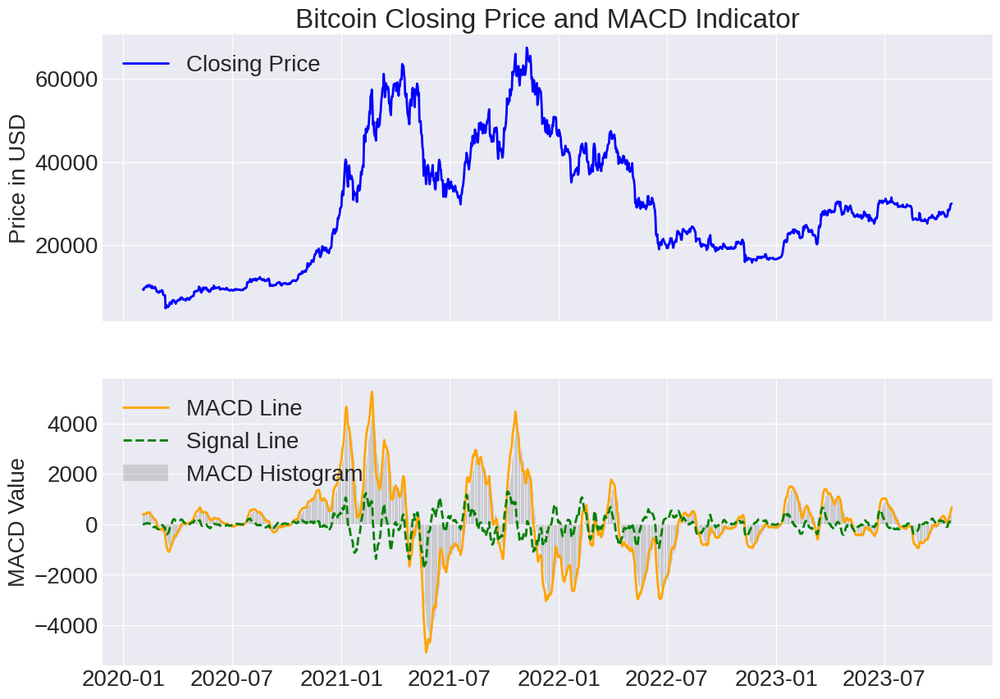

In [231]:
# Trend of price & MACD indicators
plt.style.use('seaborn-darkgrid')
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

ax1.plot(daily_df.index, daily_df['close'], label='Closing Price', color='blue', linewidth=2)
ax1.set_title('Bitcoin Closing Price and MACD Indicator')
ax1.set_ylabel('Price in USD')
ax1.legend(loc='upper left')

ax2.plot(daily_df.index, daily_df['MACD'], label='MACD Line', color='orange', linewidth=2)
ax2.plot(daily_df.index, daily_df['MACD_Signal'], label='Signal Line', color='green', linestyle='--', linewidth=2)
ax2.bar(daily_df.index, daily_df['MACD_Hist'], label='MACD Histogram', color='grey', alpha=0.3)
ax2.legend(loc='upper left')
ax2.set_ylabel('MACD Value')

plt.show()

Each visualization and statistical tool unravels a piece of the market puzzle, collectively providing a comprehensive understanding that serves as a foundation for predictive modeling and informed decision-making in the ever-changing landscape of cryptocurrency trading.

#IV. Feature Selection

In [232]:
daily_df

,open,high,low,close,Volume USDT,SMA_3,CMA_3,ema_3,MACD,MACD_Signal,MACD_Hist,Parabolic_SAR,Aroon_Up,Aroon_Down,RSI,Stochastic_Oscillator,CCI,OBV,Acc_Dist_Line,ATR,Bollinger_M,Bollinger_H,Bollinger_L,movement
date,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-03,9340.49,9647.61,9250.00,9300.64,1491076824,9343.9,8466.963824,9328.923056,395.175072,21.969807,373.205265,0.0,100.0,4.0,65.113805,75.227222,103.193114,6724734331,8.893850e+09,340.314969,8926.4855,9655.500840,8197.470160,Down
2020-02-04,9300.63,9368.00,9105.00,9198.35,1363688326,9279.1,8487.860571,9263.636528,372.414479,-0.632628,373.047108,0.0,96.0,0.0,61.790204,67.923976,59.005703,5361046005,8.498225e+09,334.792471,8945.1380,9681.891733,8208.384267,Up
2020-02-05,9198.32,9799.08,9179.88,9630.00,2014987371,9376.3,8519.586667,9446.818264,384.771685,9.379662,375.392023,0.0,100.0,4.0,68.984629,89.106232,106.269853,7376033376,9.412780e+09,355.107295,8990.3840,9776.983865,8203.784135,Up
2020-02-06,9630.00,9884.00,9550.00,9778.12,1950865330,9535.5,8553.601081,9612.469132,401.884234,21.193769,380.690465,0.0,100.0,0.0,71.002306,93.532071,124.267146,9326898706,1.012677e+10,353.599631,9033.3540,9890.344151,8176.363849,Up
2020-02-07,9777.97,9900.00,9736.66,9821.52,1272175087,9743.2,8586.967368,9716.994566,414.173733,26.786614,387.387119,0.0,100.0,0.0,71.585582,95.179361,121.041429,10599073793,1.017646e+10,340.009657,9078.1800,9999.205325,8157.154675,Up
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-18,28392.83,28982.36,28142.87,28320.00,914252447,28405.6,28368.757052,28199.274633,283.736592,86.517455,197.219137,0.0,92.0,8.0,62.544511,51.463884,142.272746,-72954424784,2.424498e+11,746.437502,27523.8770,28611.260959,26436.493041,Up
2023-10-19,28302.55,28916.89,28100.66,28713.71,1023351782,28476.5,28369.006116,28456.492317,347.579129,120.287993,227.291135,0.0,88.0,4.0,66.017946,62.838381,141.915588,-71931073002,2.429637e+11,751.422680,27614.2145,28779.025049,26449.403951,Up
2023-10-20,28716.26,30207.55,28578.29,29669.04,1752160445,28900.9,28369.944091,29062.766158,469.845855,194.043776,275.802079,0.0,100.0,0.0,72.646493,85.322264,224.006170,-70178912557,2.435576e+11,814.125346,27749.5385,29178.896442,26320.180558,Up


In [233]:
#Split the data into train and test set and transforming the y variables
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
X = daily_df.drop("movement", axis=1)
y = daily_df["movement"].copy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

In [234]:
#Preparing pipeline for scaling the data and future use
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_selector

from sklearn import set_config
set_config(display='diagram')

num_pipeline = Pipeline([('scaler', StandardScaler())])

prep_pipeline = ColumnTransformer([('num', num_pipeline, make_column_selector(dtype_include=np.number))])

prep_pipeline

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('scaler', StandardScaler())]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x7c3a8e3f9960>)])

###K-Best

In [235]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

#Conducting K-best for feature selection
kbest = SelectKBest(score_func=f_classif)
k_best_pipe = Pipeline([('prep', prep_pipeline), ('select', kbest), ('model', LogisticRegression())])
param_grid = {'select__k': range(1, X_train.shape[1] + 1)}
grid_search = GridSearchCV(k_best_pipe, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

#Showing the results
cv_res = pd.DataFrame(grid_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)
display(cv_res.filter(regex = '(^param_|mean_test_score)', axis=1))
best_model = grid_search.best_estimator_
print(f'The selected features are {best_model["prep"].get_feature_names_out()[best_model["select"].get_support()]}')


,param_select__k,mean_test_score
9,10,0.546083
0,1,0.545183
10,11,0.544240
1,2,0.540574
4,5,0.537805
8,9,0.537797
6,7,0.537797
5,6,0.535032
11,12,0.535023
7,8,0.533184


The selected features are ['num__open' 'num__high' 'num__low' 'num__close' 'num__SMA_3' 'num__CMA_3'
 'num__ema_3' 'num__Acc_Dist_Line' 'num__Bollinger_M' 'num__Bollinger_L']


### Forward Selection

In [236]:
from mlxtend.feature_selection import SequentialFeatureSelector

#Preparing the pipeline for sequential feature selector
sfs = SequentialFeatureSelector(LogisticRegression(), k_features="best", scoring='accuracy')
preprocess_pipeline = Pipeline([('prep', prep_pipeline), ('select', sfs)])
preprocess_pipeline

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7c3a8e3f9960>)])),
                ('select',
                 SequentialFeatureSelector(estimator=LogisticRegression(),
                                           k_features='best',
                                           scoring='accuracy'))])

feature combination (6, 9, 16) gave best accuracy of 0.56.



,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(6,)","[0.5668202764976958, 0.5207373271889401, 0.539...",0.545183,"(6,)",0.028966,0.022536,0.011268
2,"(6, 16)","[0.5944700460829493, 0.5207373271889401, 0.552...",0.559929,"(6, 16)",0.046232,0.03597,0.017985
3,"(6, 9, 16)","[0.5944700460829493, 0.5161290322580645, 0.594...",0.564529,"(6, 9, 16)",0.052156,0.040579,0.020289
4,"(4, 6, 9, 16)","[0.5944700460829493, 0.511520737327189, 0.5760...",0.559929,"(4, 6, 9, 16)",0.045774,0.035614,0.017807
5,"(4, 6, 9, 14, 16)","[0.5806451612903226, 0.5161290322580645, 0.571...",0.558086,"(4, 6, 9, 14, 16)",0.042036,0.032706,0.016353
6,"(4, 6, 9, 12, 14, 16)","[0.5668202764976958, 0.5253456221198156, 0.571...",0.556238,"(4, 6, 9, 12, 14, 16)",0.038794,0.030183,0.015092
7,"(4, 6, 9, 12, 14, 16, 22)","[0.5852534562211982, 0.5253456221198156, 0.571...",0.556243,"(4, 6, 9, 12, 14, 16, 22)",0.034073,0.02651,0.013255
8,"(3, 4, 6, 9, 12, 14, 16, 22)","[0.5622119815668203, 0.5299539170506913, 0.557...",0.554403,"(3, 4, 6, 9, 12, 14, 16, 22)",0.031395,0.024426,0.012213
9,"(3, 4, 5, 6, 9, 12, 14, 16, 22)","[0.5714285714285714, 0.5345622119815668, 0.557...",0.553473,"(3, 4, 5, 6, 9, 12, 14, 16, 22)",0.031108,0.024203,0.012101
10,"(3, 4, 5, 6, 7, 9, 12, 14, 16, 22)","[0.5714285714285714, 0.5345622119815668, 0.557...",0.552547,"(3, 4, 5, 6, 7, 9, 12, 14, 16, 22)",0.032868,0.025572,0.012786


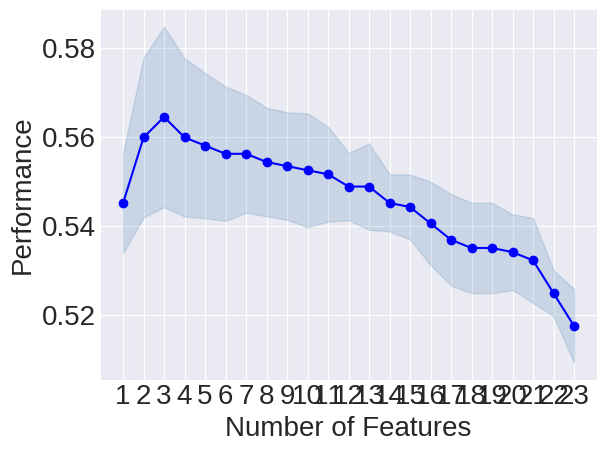

In [237]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

#Executing Forward selection and show the result
processed_X = preprocess_pipeline.fit_transform(X_train, y_train)
print(f'feature combination {sfs.k_feature_idx_} gave best accuracy of {sfs.k_score_:.2f}.\n')
display(pd.DataFrame.from_dict(sfs.get_metric_dict()).T)
plot_sfs(sfs.get_metric_dict(), kind='std_err');

###Backward Selection

feature combination (0, 1, 2, 3, 4, 10, 12, 13, 14, 17, 18) gave best accuracy of 0.55.



,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
23,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.4930875576036866, 0.5207373271889401, 0.543...",0.51752,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.021317,0.016586,0.008293
22,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.4700460829493088, 0.5253456221198156, 0.548...",0.524902,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.040619,0.031603,0.015801
21,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.47465437788018433, 0.511520737327189, 0.576...",0.527663,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.047378,0.036862,0.018431
20,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14...","[0.511520737327189, 0.5529953917050692, 0.5437...",0.535053,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14...",0.017801,0.01385,0.006925
19,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14...","[0.5207373271889401, 0.5529953917050692, 0.543...",0.537818,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14...",0.013947,0.010851,0.005426
18,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14...","[0.5529953917050692, 0.543778801843318, 0.5299...",0.540587,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14...",0.009819,0.00764,0.00382
17,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 16...","[0.5944700460829493, 0.5483870967741935, 0.525...",0.545178,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 16...",0.034393,0.026759,0.013379
16,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 17...","[0.5806451612903226, 0.5345622119815668, 0.543...",0.548874,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 17...",0.024124,0.018769,0.009385
15,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 17...","[0.5806451612903226, 0.5345622119815668, 0.543...",0.548878,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 17...",0.022471,0.017483,0.008742
14,"(0, 1, 2, 3, 4, 5, 7, 8, 10, 12, 13, 14, 17, 18)","[0.5944700460829493, 0.5299539170506913, 0.543...",0.550721,"(0, 1, 2, 3, 4, 5, 7, 8, 10, 12, 13, 14, 17, 18)",0.030055,0.023384,0.011692


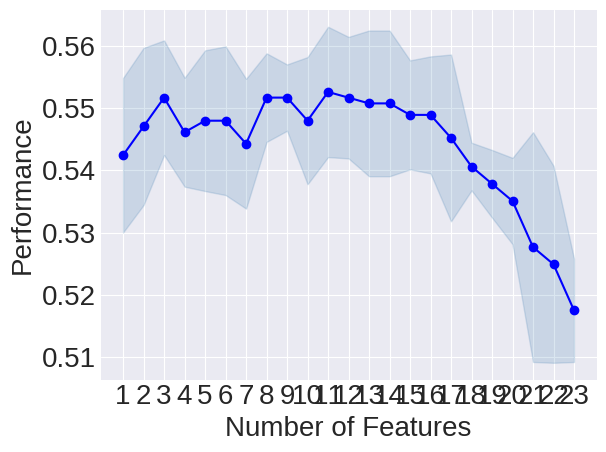

In [238]:
#Executing the Backward Selection
sbs = SequentialFeatureSelector(LogisticRegression(), forward=False, k_features="best", scoring='accuracy')
backward_preprocess_pipeline = Pipeline([('prep', prep_pipeline),('select', sbs)])
backward_preprocess_pipeline.fit(X_train, y_train)

#Showing result of selection
print(f'feature combination {sbs.k_feature_idx_} gave best accuracy of {sbs.k_score_:.2f}.\n')
display(pd.DataFrame.from_dict(sbs.get_metric_dict()).T)
plot_sfs(sbs.get_metric_dict(), kind='std_err');

Amongst the three models, Forward Selection delivered the highest performance, scoring an accuracy of 0.56. Yet, it opted for a substantially smaller set of features, encompassing only three columns. Our research indicated that predicting price movement direction necessitates a multifaceted consideration of various technical indicators, often comprising more than three indicators across different dimensions.

Notably, the disparity in the number of features selected by K-best and Backward Selection, compared to Forward Selection, raised concerns. The limited selection in Forward Selection might have prematurely omitted potential influential features, potentially neglecting crucial interactions between variables and leading to underfitting. Consequently, we've decided against using the Forward Selection results.

Upon examining the remaining options, Backward Selection outperformed K-best. Therefore, we've determined to leverage the features identified through Backward Selection for our model training and subsequent predictions. This decision ensures a more comprehensive consideration of relevant features, likely resulting in enhanced predictive power for price movement direction.

In [239]:
#Getting the features out from backward search
selected_feature_indices = sbs.k_feature_idx_
selected_feature_indices = np.array(selected_feature_indices).flatten()
selected_column_names = X_train.columns[selected_feature_indices]
back_X = X_train[selected_column_names]
back_test_X = X_test[selected_column_names]
selected_column_names

Index(['open', 'high', 'low', 'close', 'Volume USDT', 'MACD_Hist', 'Aroon_Up',
       'Aroon_Down', 'RSI', 'OBV', 'Acc_Dist_Line'],
      dtype='object')

# V. Modle Fitting

##Logistic Regression

In [240]:
#Fitting the pipeline for logistic regression
pipeline = Pipeline([
    ('prep', prep_pipeline),
    ('model', LogisticRegression()),
])

pipeline

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7c3a8e3f9960>)])),
                ('model', LogisticRegression())])

In [264]:
#Fitting the Logit model
pipeline.fit(back_X, y_train)
accuracy = pipeline.score(back_test_X, y_test)
print(f'The accuracy of the  model is: {accuracy}')

The accuracy of the  model is: 0.5387453874538746


In [241]:
#Using Grid Search CV to tune the model
param_grid = {'model__C': [0.1, 1, 10, 100],  'model__solver': ['liblinear', 'lbfgs', 'sag', 'newton-cg']}
grid_search = GridSearchCV(pipeline, param_grid, cv=4, scoring='accuracy')
grid_search.fit(back_X, y_train)

#Get the best parameters and the best score
lr_best_params = grid_search.best_params_
best_score = grid_search.best_score_

#Evaluate the best model on the test set
lr_best_model = grid_search.best_estimator_
test_score = lr_best_model.score(back_test_X, y_test)
print("Best Parameters for Logistic Regression in Grid Search is:", lr_best_params)
print("Best Cross-validation Score for Logistic Regression in Grid Search is:", best_score)
print("Best Test Score for Logistic Regression in Grid Search is:", test_score)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/usr/local/lib/python3.10/dist-packages/

Best Parameters for Logistic Regression in Grid Search is: {'model__C': 10, 'model__solver': 'liblinear'}
Best Cross-validation Score for Logistic Regression in Grid Search is: 0.5544280442804428
Best Test Score for Logistic Regression in Grid Search is: 0.5424354243542435


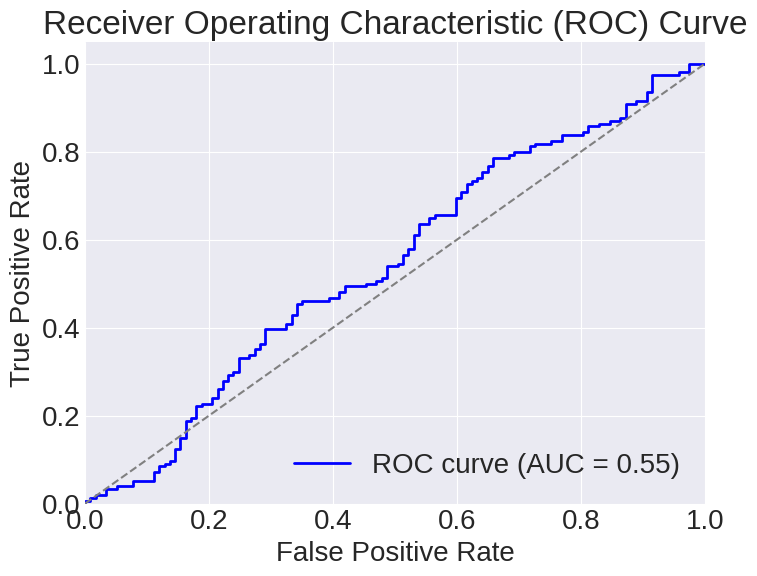

In [242]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

y_probs = lr_best_model.predict_proba(back_test_X)[:, 1]

#Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

#Plotting ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

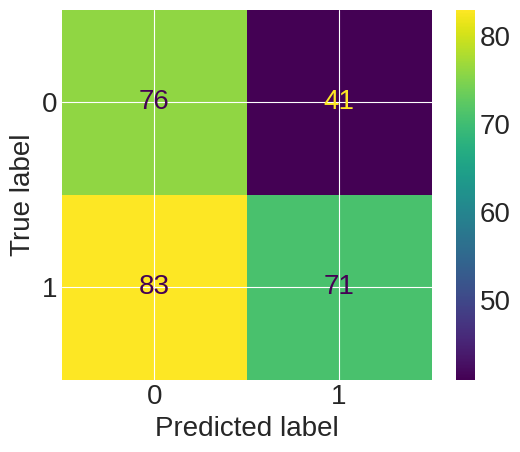

In [243]:
import matplotlib as mpl

#Constructing the Confusion matrix
from sklearn.metrics import ConfusionMatrixDisplay
y_pred = lr_best_model.predict(back_test_X)
mpl.rcParams['font.size'] = 20
ConfusionMatrixDisplay.from_predictions(y_test, y_pred);

##XGBoost

In [244]:
from xgboost import XGBClassifier

# preprocess the training data
tr_X = prep_pipeline.fit_transform(back_X)
tr_y = y_train

# preprocess the test data
t_X = prep_pipeline.transform(back_test_X)
t_y = y_test

# check sizes
back_X.shape, tr_X.shape, tr_y.shape, t_X.shape, t_y.shape

((1084, 11), (1084, 11), (1084,), (271, 11), (271,))

In [245]:

#Splitting the train test set from the training data of the whole model to determine how many trees to grow
tr_X_tr, tr_X_v, tr_y_tr, tr_y_v = train_test_split(tr_X, tr_y, test_size = .2, random_state=0)

#Fitting the XGBClassifier
bst = XGBClassifier(n_estimators=100,
                    max_leaves=16,
                    learning_rate=0.1,
                    eval_metric='auc',
                    early_stopping_rounds=10,
                    objective='binary:logistic')
bst.fit(tr_X_tr, tr_y_tr, eval_set=[(tr_X_v, tr_y_v)], verbose=False)
print(f'The accuracy of a normal XGBoost is {bst.score(t_X, t_y):.4f}.')


The accuracy of a normal XGBoost is 0.5203.


In [246]:
from sklearn.metrics import accuracy_score

#Using Grid Search for XGBClassifier
xgb_model = XGBClassifier()
xgb_param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
}

#Perform grid search with F1 score as the scoring metric
xgb_grid_search = GridSearchCV(xgb_model, xgb_param_grid, cv=4, scoring='accuracy')
xgb_grid_search.fit(back_X, y_train)

#Get the best parameters and the best model
xgb_best_params = xgb_grid_search.best_params_
xgb_grid_best_model = xgb_grid_search.best_estimator_

#Evaluate the model on the test set
xgb_test_score = xgb_grid_best_model.score(back_test_X, y_test)
xgb_test_score
print(f"Best parameters for XGBClassifier Grid Search: {xgb_best_params}")
print(f"Best test score for XGBClassifier Grid Search: {xgb_test_score}")


Best parameters for XGBClassifier Grid Search: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50}
Best test score for XGBClassifier Grid Search: 0.5461254612546126


In [247]:
#Display the Grid Search Result in DataFrame
xgb_grid_cv_res = pd.DataFrame(xgb_grid_search.cv_results_)
xgb_grid_cv_res.sort_values(by='mean_test_score', ascending=False, inplace=True)
xgb_grid_cv_res.filter(regex = '(^param_|mean_test_score)', axis=1).head()

,param_learning_rate,param_max_depth,param_n_estimators,mean_test_score
0,0.01,3,50,0.542435
1,0.01,3,100,0.536900
23,0.2,4,200,0.529520
4,0.01,4,100,0.525830
5,0.01,4,200,0.524908


In [248]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint

#Using Randomized Search for XGBClassifier
xgb_param_distribs = {'learning_rate': np.logspace(-3, 3, 4),
                  'max_depth': randint(low=2, high=20),
                'n_estimators': randint(low=50, high=250),
                  }

xgb_rnd_search = RandomizedSearchCV(xgb_model, xgb_param_distribs, n_iter=27, cv=4, scoring='accuracy', random_state=42)
xgb_rnd_search.fit(back_X, y_train)

RandomizedSearchCV(cv=4,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   n_iter=27,
                   param_distributions={'learning_rate': array([1.e-03, 1.e-01, 1.e+01, 1.e+03]),
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7c3a062c7eb0>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7c3a062e6a40>},
                   random_state=42, scoring='accuracy')

In [249]:
#Display the Randomized Search Result in DataFrame
xgb_rnd_cv_res = pd.DataFrame(xgb_rnd_search.cv_results_)
xgb_rnd_cv_res.sort_values(by='mean_test_score', ascending=False, inplace=True)
xgb_rnd_cv_res.filter(regex = '(^param_|mean_test_score)', axis=1).head()

,param_learning_rate,param_max_depth,param_n_estimators,mean_test_score
13,1000.0,4,100,0.540590
4,1000.0,4,199,0.540590
22,1000.0,3,183,0.517528
11,0.1,16,239,0.517528
12,10.0,13,104,0.516605


As Randomized Search show better result, hence we choose the XGBoost model with Randomized Search as our final model for XGBoost Classifier.

In [250]:
#Evaluate the model using the test data
xgb_rnd_best_model = xgb_rnd_search.best_estimator_
xgb_test_score = xgb_rnd_best_model.score(back_test_X, y_test)
xgb_test_score

0.4907749077490775

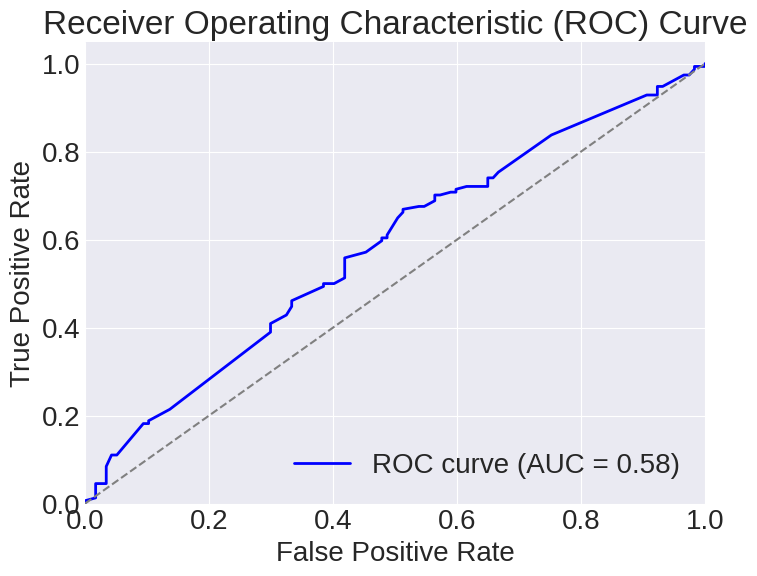

In [251]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
xgb_grid_y_probs = xgb_grid_best_model.predict_proba(back_test_X)[:, 1]

# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_test, xgb_grid_y_probs)
roc_auc = auc(fpr, tpr)

# Plotting ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

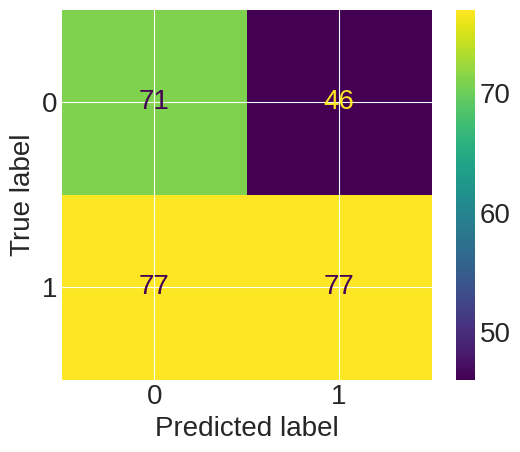

In [252]:
import matplotlib as mpl
from sklearn.metrics import ConfusionMatrixDisplay
xgb_y_pred = xgb_grid_best_model.predict(back_test_X)
mpl.rcParams['font.size'] = 20
ConfusionMatrixDisplay.from_predictions(y_test, xgb_y_pred);

## Random Forest

In [253]:
#Fitting the pipeline for Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
rf_pipeline = Pipeline([
    ('prep', prep_pipeline),
    ('model',RandomForestClassifier(random_state=0)),
])

rf_pipeline

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7c3a8e3f9960>)])),
                ('model', RandomForestClassifier(random_state=0))])

In [265]:
#Fitting the RF model
rf_pipeline.fit(back_X, y_train)
accuracy = rf_pipeline.score(back_test_X, y_test)
print(f'The accuracy of the RF model is: {accuracy}')

The accuracy of the RF model is: 0.5830258302583026


In [254]:
from sklearn.model_selection import GridSearchCV

#Using Grid Search for Random Forest Classifier
param_grid = {
    'model__n_estimators': [50, 100, 200],
    'model__max_depth': [None, 10, 20],
    'model__min_samples_split': [2, 5, 10],
    'model__min_samples_leaf': [1, 2, 4]
}
rf_grid_search = GridSearchCV(estimator=rf_pipeline, param_grid=param_grid, scoring='accuracy', cv=4)
rf_grid_search.fit(back_X, y_train)
rf_best_params = rf_grid_search.best_params_
rf_best_score = rf_grid_search.best_score_


# Evaluate the best model on the test set
rf_best_model = rf_grid_search.best_estimator_
rf_test_score = rf_best_model.score(back_test_X, y_test)
print("Random Forest Best Parameters:", rf_best_params)
print("Random Forest Best Cross-validation Score:", rf_best_score)
print("Random Forest Test Set Score of Best Model:", rf_test_score)

Random Forest Best Parameters: {'model__max_depth': 20, 'model__min_samples_leaf': 2, 'model__min_samples_split': 2, 'model__n_estimators': 50}
Random Forest Best Cross-validation Score: 0.5156826568265682
Random Forest Test Set Score of Best Model: 0.5719557195571956


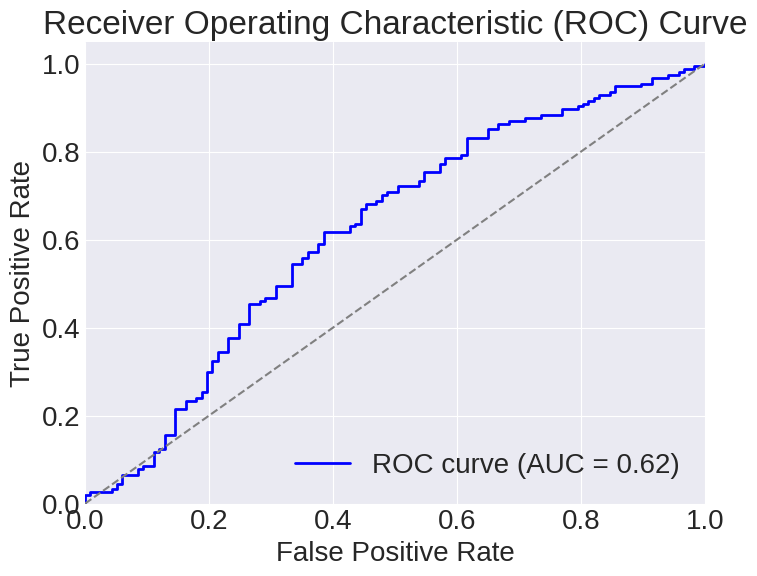

In [255]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

rf_y_probs = rf_best_model.predict_proba(back_test_X)[:, 1]

# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_test, rf_y_probs)
roc_auc = auc(fpr, tpr)

# Plotting ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


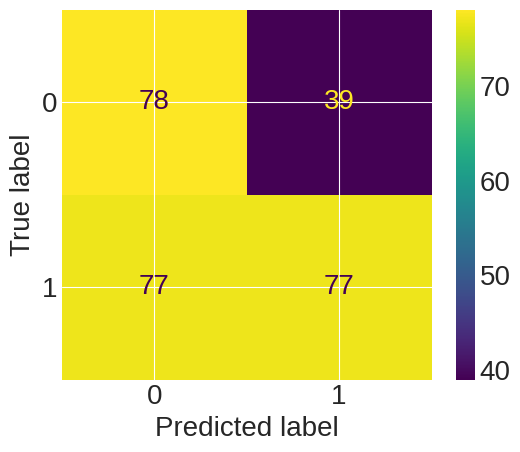

In [256]:
import matplotlib as mpl

#Constructing the Confusion matrix
from sklearn.metrics import ConfusionMatrixDisplay
rf_y_pred = rf_best_model.predict(back_test_X)
mpl.rcParams['font.size'] = 20
ConfusionMatrixDisplay.from_predictions(y_test, rf_y_pred);

## Support Vector Machine

In [257]:
from sklearn.svm import SVC
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score

#Preparing pipeline for SVM
pipeline_svm = Pipeline([
    ('prep', prep_pipeline),
    ('model', SVC(kernel='rbf', probability=True)),
])

#Fitting the SVM model
pipeline_svm.fit(back_X, y_train)
accuracy = pipeline_svm.score(back_test_X, y_test)
print(f'The accuracy of the SVM model is: {accuracy}')

The accuracy of the SVM model is: 0.5387453874538746


In [258]:
#Using Grid Search for SVM
param_grid = {
    'model__C': [0.1, 1, 10, 100],
    'model__gamma': [1, 0.1, 0.01, 0.001],
    'model__kernel': ['rbf']
}

grid_search = GridSearchCV(estimator=pipeline_svm,
                           param_grid=param_grid,
                           cv=5,
                           verbose=2,
                           n_jobs=-1,
                           scoring='accuracy')
grid_search.fit(back_X, y_train)

#Displaying the result
print(f'Best parameters found for SVM: {grid_search.best_params_}')
print(f'Best cross-validated accuracy for SVM: {grid_search.best_score_}')

#Fit and predict using the best model
svm_best_param = grid_search.best_params_
svm_best_model = grid_search.best_estimator_
svm_best_model.fit(back_X, y_train)
final_accuracy = svm_best_model.score(back_test_X, y_test)
print(f'The final test accuracy of the SVM model is: {final_accuracy}')

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best parameters found for SVM: {'model__C': 10, 'model__gamma': 0.001, 'model__kernel': 'rbf'}
Best cross-validated accuracy for SVM: 0.5442524321556579
The final test accuracy of the SVM model is: 0.4981549815498155


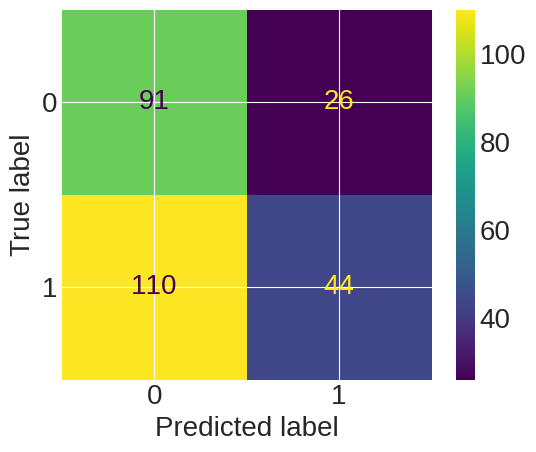

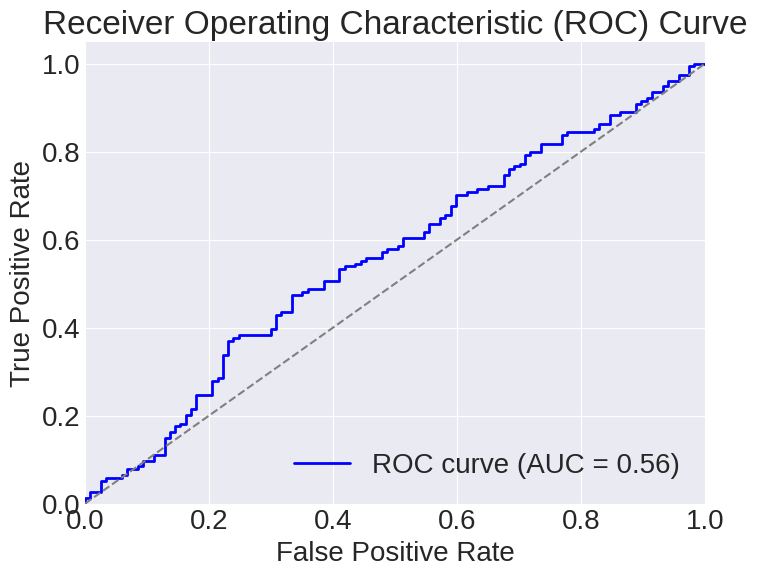

In [259]:
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score

y_pred = svm_best_model.predict(back_test_X)
y_pred_decision = svm_best_model.decision_function(back_test_X)
conf_matrix = confusion_matrix(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_decision)
roc_auc = roc_auc_score(y_test, y_pred_decision)

mpl.rcParams['font.size'] = 20
ConfusionMatrixDisplay.from_predictions(y_test, y_pred);

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# **VI. Ensemble Model**

We have used two Ensemble Model, which is Stacking and Voting.

## Stacking Classifier

In [260]:
from sklearn.ensemble import StackingClassifier

lr_params = {'C': 10, 'solver': 'liblinear'}
svm_params = {'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}
rf_params = {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}
xgb_params = {'use_label_encoder': False, 'eval_metric': 'auc', 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50}

# Create models with specified hyperparameters
lr_model = LogisticRegression(**lr_params)
svm_model = SVC(**svm_params, probability=True)
rf_model = RandomForestClassifier(**rf_params)
xgb_model = XGBClassifier(**xgb_params)

#Set the base models
base_estimators = [
    ('logreg', lr_model),
    ('svm', svm_model),
    ('rf', rf_model),
    ('xgb', xgb_model)
]
# Define the meta-model as Logistic Regression
meta_model = LogisticRegression()

# Create the stacking ensemble
stacking_clf = StackingClassifier(estimators=base_estimators, final_estimator=meta_model, cv=4)

# Train and Evaluate the stacking ensemble
stacking_clf.fit(tr_X, tr_y)
stacking_score = stacking_clf.score(t_X, t_y)
print(f'Stacking ensemble accuracy: {stacking_score}')

Stacking ensemble accuracy: 0.4797047970479705


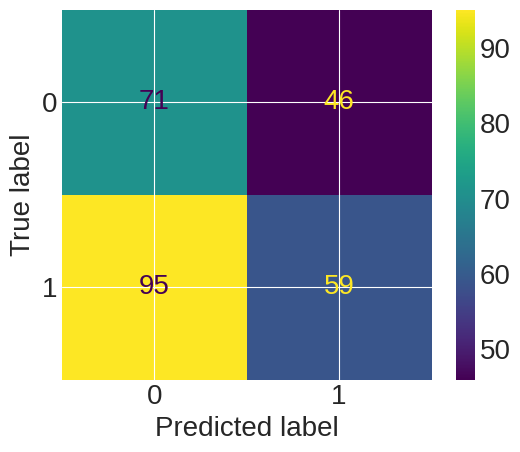

In [261]:
#Construct confusion matrix
y_pred = stacking_clf.predict(t_X)
conf_matrix = confusion_matrix(y_test, y_pred)
mpl.rcParams['font.size'] = 20
ConfusionMatrixDisplay.from_predictions(y_test, y_pred);

## Voting Classifier

In [262]:
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import cross_val_score


# Create the individual models
log_clf = lr_model
svm_clf = svm_model
rf_clf = rf_model
xgb_clf = xgb_model

# Create an ensemble of models
ensemble_clf = VotingClassifier(
    estimators=[('lr', log_clf), ('svm', svm_clf), ('rf', rf_clf), ('xgb', xgb_clf)],
    voting='soft'
)

# Train the ensemble model
ensemble_clf.fit(tr_X, tr_y)

# Evaluate the ensemble model
ensemble_score = ensemble_clf.score(t_X, t_y)
print(f'Ensemble model accuracy: {ensemble_score}')

Ensemble model accuracy: 0.5535055350553506


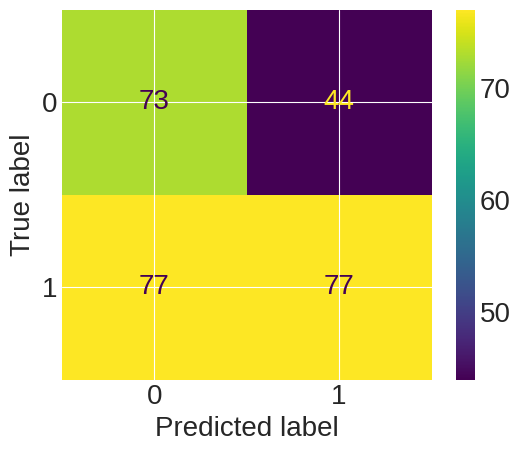

In [263]:
#Construct confusion matrix
y_pred = ensemble_clf.predict(t_X)
conf_matrix = confusion_matrix(y_test, y_pred)
mpl.rcParams['font.size'] = 20
ConfusionMatrixDisplay.from_predictions(y_test, y_pred);


Overall, Voting has a much higher accuracy than Stacking

#**VII. Summary of result**

In the context of predicting Bitcoin price movements, several machine learning models were evaluated. The Random Forest model showed moderate performance, with a test score of approximately 0.572, indicating some capability to generalize but with a higher false negative rate. XGBoost achieved an accuracy of 0.5203 after hyperparameter tuning, demonstrating moderate discrimination between classes but with false positives and false negatives. Logistic Regression had limited predictive power, with a test score of around 0.542, highlighting the complexity of financial time series modeling.

In contrast, the SVM model with an RBF kernel and Stacking Classifier performed poorly, with a test accuracy of approximately 0.498 and a tendency to predict the negative class. These results underscore the challenges in predicting Bitcoin price fluctuations and suggest the need for further model refinement, potential feature engineering, and consideration of alternative approaches to enhance predictive accuracy in this volatile domain.

Upon furthure research, we found researchs conducted on comparing between different ML for BTC forecast found that random forest to be the best performing model. This confirms our model result.

#**VIII. Challenge**

We encountered three primary challenges while working with this dataset. Initially, we intended to employ time series regression alongside linear regression for comparison. Due to time constraints, delving into advanced time-series regression techniques became unfeasible. Consequently, we opted for simple linear regression to forecast Bitcoin prices.

Subsequently, the second challenge emerged. While utilizing the original dataset and conducting feature selection using K-best, Best Forward Selection, and Best Backward Selection, we discovered an inefficiency in choosing necessary factors. Upon revisiting the dataset, we realized that, apart from the essential features (Open, High, Low, Close, Volume, and trade count), other technical features were derived solely from the close price. This resulted in severe multicollinearity, where variables exhibited high correlation. This correlation hindered the identification of key predictors, impacting feature selection accuracy and potentially increasing model errors. To address this, we researched and identified more complex technical indicators commonly used by Bitcoin algorithmic traders. Also, with more research, we seen that the algorithmic trader of bitcoin usually use to technical indicator to predict if the price will rise or decrease, or if the market is in bullish or bearish trend. Hence, we shifted our focus towards classification, deriving new technical indicators with lower multicollinearity. This approach allowed us to pinpoint key features influencing the dependent variable more accurately.

Another challenge involved determining an appropriate method for splitting the data into training and test sets. Given the evolving nature of the dataset and technical indicators over time, conventional train-test splits for cross-sectional data might not be suitable. Upon consulting our professor, we attempted to split the data by using only the last 10 days as the test set, with the remainder as the training set. However, the accuracy of predictions fell notably below expectations compared to the standard train-test split. This discrepancy may be attributed to several factors. Firstly, employing classification models designed for cross-sectional data within a time-series regression framework might not be effective. Additionally, the limited 10-day test set, alongside 1345 training data points, might have led to overfitting, incorporating noise and affecting performance. Moreover, the nature of the indicator magnitudes for each record seemed more indicative of cross-sectional movement rather than time-series behavior. Consequently, we reverted to using a conventional train-test split to train our model and make predictions.


#**IX. Conclusion**

In our quest to forecast Bitcoin price movements using machine learning, we deployed four distinct models: Logistic Regression, XGBoost, Random Forest Classifier, and Support Vector Machine. The Random Forest Classifier demonstrated superior proficiency, achieving a test set score of about 0.572, indicative of its robust capability to navigate the nonlinear interplay between features that characterizes financial time series data.

When we consider ensemble techniques, the Ensemble model utilizing a 'soft' voting system achieved greater accuracy at 0.561 compared to the Stacking ensemble's 0.494. This suggests that the Ensemble model's collective prediction strategy was more adept at decoding the intricate patterns within the data, compared to the Stacking ensemble, which was potentially constrained by the Logistic Regression meta-model.

However, the overall modest performance of these models highlights the intricate nature of the Bitcoin market, which is subject to the whims of regulatory news, technological shifts within blockchain, market influences from significant holders, and the rate of mainstream adoption. These factors collectively contribute to the unpredictability of Bitcoin prices, presenting substantial challenges to predictive modeling.

To refine predictive capabilities, future research should not only consider advanced algorithms like neural networks and time series analysis but also embrace machine learning models that dynamically adjust to new data, such as those with reinforcement learning or adaptive algorithms. Such models, supported by a wider spectrum of data encompassing market sentiment and technological trends, could offer more sophisticated and precise market navigation. The integration of these innovative methods and diverse data inputs promises to augment the predictive strength of trading algorithms, thereby facilitating more strategic decision-making in the volatile realm of cryptocurrency trading.

# **Reference**

"Forecasting Bitcoin with technical analysis: A not-so-random forest?" Journal of Title, vol. Volume Number, no. Issue Number, 2021, pp. Page Range, doi:10.1016/j.joi.2021.101230.

Investopedia. "Top 7 Technical Analysis Tools." Investopedia, 2023, https://www.investopedia.com/top-7-technical-analysis-tools-4773275.

OpenAI. "GPT-3.5: Language Model by OpenAI." OpenAI, OpenAI, Year, https://www.openai.com/.